# PCA Analysis

We have hourly count data, over a lot of years and locations.

**Can we simplify this data?**

Do we really need 24 numbers to describe a days worth of data in a single location? Because we have such regularity in the data (daily, weekly cycle), I suspect that we don't. PCA would be a good place to start investigating this.

**Visualisation**

By visualising the transformed space, what insights can we get into urban geography.


**Denoising**

I think building forecasters based on the hourly data will be an intense process. If we could reduce a days/weeks worth of data down to a few numbers this could help with that.

**Clustering?**

PCA can be used as step in a clustering pipeline. This is typically used for denoising purposes (often seen in analysis of MNIST or Hand Written Digit data sets). So it might feed in there.

In [1]:
import datetime
import itertools
import random
import pickle
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import plot
from plotly.io import write_html

import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.base import clone

from IPython.core.display import Javascript
from IPython.display import display
from IPython.display import HTML

from PedestrianDataImporter import getHourlyCounts
from Imputation import imputeMissing

In [2]:
def disable_scroll():
    display(Javascript("""
        window.addEventListener('load', function() {
            IPython.OutputArea.prototype._should_scroll = function(lines) {
                return false;
            }
        });
    """))

disable_scroll()

<IPython.core.display.Javascript object>

## Data importing and some manipulations

Lets first import the Melbourne data and cut out a time window in 2018 and 2019 to deal with

In [3]:
df_counts,df_locations = getHourlyCounts['Melbourne']()
df_counts = imputeMissing(df_counts)

start_date = datetime.datetime(2018,1,1)
end_date   = datetime.datetime(2020,1,1)
cut = (df_counts['DateTime'] >  start_date) & (df_counts['DateTime'] < end_date ) 
df_cut = df_counts.loc[cut]
df1 = df_cut[['DateTime','LocationName','HourlyCount']]
df1 = df1.dropna(axis='columns',how='any')

Loading Melbourne_stored.pkl
Todo: Imputation


We want vectors that represent a days worth of counts or a weeks worth of counts.
While we at it lets also take just weekdays and weekends, we have seen that these have different behaviours

In [4]:
df1['Day']  = df1['DateTime'].dt.dayofweek  # 0: Monday, 1: Tuesday, ..., 6: Sunday
df1['Hour'] = df1['DateTime'].dt.hour
df1['Week'] = df1['DateTime'].dt.isocalendar().week
df1['Year'] = df1['DateTime'].dt.year
df1['Date'] = df1['DateTime'].dt.date

df1['Day_Hour'] = df1['Day'] * 24 + df1['Hour']
df1['Year_Week'] = df1['Year'].astype(str) + "_" + df1['Week'].astype(str).str.zfill(2)  # zfill ensures week 1 is "01", week 2 is "02", etc.

weekdays = df1['Day'] < 5
weekends = df1['Day'] >= 5

df_days = df1.pivot_table(index=['LocationName', 'Date'],
    columns='Hour', values='HourlyCount', aggfunc='sum').reset_index()

df_weekdays = df1.loc[weekdays].pivot_table(index=['LocationName', 'Date'],
    columns='Hour', values='HourlyCount', aggfunc='sum').reset_index()

df_weekends = df1.loc[weekends].pivot_table(index=['LocationName', 'Date'],
    columns='Hour', values='HourlyCount', aggfunc='sum').reset_index()

df_weeks = df1.pivot_table(index=['LocationName', 'Year_Week'], 
    columns='Day_Hour', values='HourlyCount', aggfunc='sum').reset_index()

#Keep the weekly data format consistent with the others
def year_week_to_date(year_week):
    year, week = map(int, year_week.split('_'))
    return pd.to_datetime(f'{year} {week} 1', format='%Y %U %w')

df_weeks['Date'] = df_weeks['Year_Week'].apply(year_week_to_date)
df_weeks = df_weeks.drop(columns='Year_Week')

Now we have datatables with the aggregated days and weeks, we want some numpy arrays.
We will also throw out any rows with missing data. This isn't perfect but it will do for now.

In [5]:
hoursdays_columns = list(range(24))  # Assuming hours are from 0 to 23 after the pivot
hoursweeks_columns = list(range(7*24))  # Assuming hours are from 0 to 167 after the pivot

def aggregatedDFtoArray(df, columns):
    data = df[columns]
    arr = data.values
    mask = ~np.isnan(arr).any(axis=1)  # Create a mask for rows without NaN values
    arr = arr[mask]  # Filter out rows with NaN values in arr
    location_names = df['LocationName'].values[mask]  # Apply the same mask to the location names
    dates = df['Date'].values[mask]
    # Check all arrays are the same length before returning
    assert len(arr) == len(location_names) == len(dates), \
        f"Array lengths differ: {len(arr)}, {len(location_names)}, {len(dates)}"
    return arr, location_names,dates

day_array,day_labels,day_dates = aggregatedDFtoArray(df_days ,hoursdays_columns)
weekday_array,weekday_labels,_ = aggregatedDFtoArray(df_weekdays,hoursdays_columns)
weekend_array,weekend_labels,_ = aggregatedDFtoArray(df_weekends,hoursdays_columns)
week_array,week_labels,_       = aggregatedDFtoArray(df_weeks,hoursweeks_columns)

It is convenient to have a the days information in a data frame so that later it is easy to find a particular day/sensor in the `fitted` array

In [6]:
day_indices = pd.DataFrame({
    "index":range(0,len(day_array)), # (replicates the index, but it's nice to have it as a column)
    #"day_array":day_array,
    "day_labels":day_labels,
    "day_dates":day_dates
})
day_indices

,index,day_labels,day_dates
0,0,Alfred Place,2018-02-01
1,1,Alfred Place,2018-02-02
2,2,Alfred Place,2018-02-03
3,3,Alfred Place,2018-02-04
4,4,Alfred Place,2018-02-05
...,...,...,...
36892,36892,Webb Bridge,2019-12-27
36893,36893,Webb Bridge,2019-12-28
36894,36894,Webb Bridge,2019-12-29
36895,36895,Webb Bridge,2019-12-30


Also define the four case study locations we discuss later

In [7]:
case_studies=["Monash Rd-Swanston St (West)", "New Quay", "Southbank", "Southern Cross Station"]
assert all([ x in day_indices.day_labels.values for x in case_studies])

## Visualisation

Lets plot the average for the days/weeks (in <span style="color:red">red</span> ), plot some samples in <span style="color:blue">blue</span>. A little transparency help us visualise the distributions.

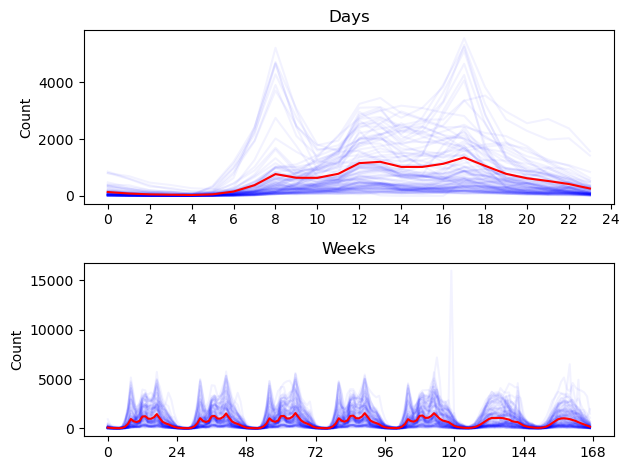

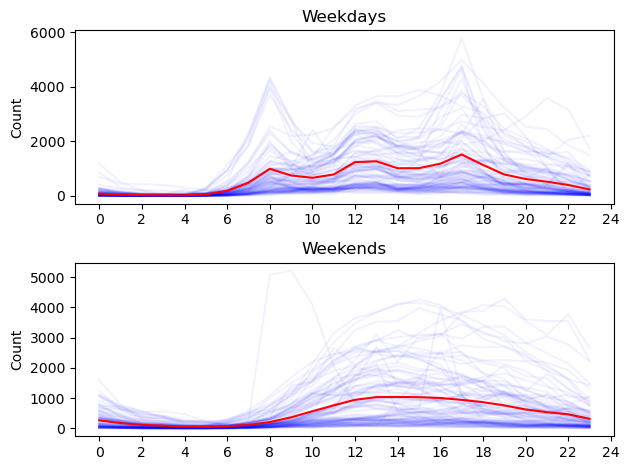

In [8]:
alpha = 0.05
N = 100

def plotAggregatedArray(arr,N,alpha,title,ax):
    # Shuffle them to mix up the locations and times.
    total_rows = len(arr)
    inds = np.random.choice(total_rows, N, replace=False)
    ax.plot(arr[inds,:].T,'b-',alpha=alpha)
    ax.plot(np.mean(arr,axis=0),'r')
    ax.set_ylabel('Count')
    ax.set_title(title)
    
fig,ax = plt.subplots(2,1)
plotAggregatedArray(day_array, N, alpha, 'Days',ax[0])
ax[0].set_xticks(np.arange(0,26,2))
plotAggregatedArray(week_array, N, alpha, 'Weeks',ax[1])
ax[1].set_xticks(np.arange(0,24*7 + 2,24))
plt.tight_layout()
plt.savefig('DailyWeeklyAgg.png')

fig,ax = plt.subplots(2,1)
plotAggregatedArray(weekday_array, N, alpha, 'Weekdays',ax[0])
ax[0].set_xticks(np.arange(0,26,2))
plotAggregatedArray(weekend_array, N, alpha, 'Weekends',ax[1])
ax[1].set_xticks(np.arange(0,26,2))
plt.tight_layout()

In [9]:
fig,ax = plt.subplots(1,1)
plotAggregatedArray(day_array, N, alpha, 'Days',ax)
ax.set_xticks(np.arange(0,26,2))
ax.grid(which='major', axis='x', linestyle='-')
ax.set_xlabel('Hour')
plt.tight_layout()
plt.savefig('Plots/PCA/AverageDays.pdf')
plt.close()

fig,ax = plt.subplots(1,1)
plotAggregatedArray(week_array, N, alpha, 'Weeks',ax)
ax.set_xticks(np.arange(0,24*7 + 2,24))
ax.grid(which='major', axis='x', linestyle='-')
ax.set_xlabel('Hour')
plt.tight_layout()
plt.savefig('Plots/PCA/AverageWeeks.pdf')
plt.close()

# What do we see 

Looking at
* **Week days** we see peaks around 8AM, 12PM and 17PM. Corresponding to commutes to work, lunch, and commute home from work
* **Week ends** we don't see the three peaks that we see during the weekdays. Slightly busier during the late hours 12PM-2AM corresponding to visits to a night life.
* **Weeks** we clearly see the weekday behaviour and weekend behaviour. Visually I can't see any difference between the weekdays.
* **Days**  The weekday behaviour dominates but has been damped down by the inclusion of the weekends.

## Choice of pipeline

Now we have a better understanding of the data. Lets start playing around with a PCA analysis.

I want to think about the effect of scaling the data on the principal components. A variance scaling step can be used as a preprocessing step in a PCA pipeline. This is most useful when the data has different *units*, for example if we measured the heights of people in nanometres and their weights in solar masses, the height dimension would show much greater variation and we would want to remove/scale this variation.

In our problem the features are the different hours of the day and are measured in the same units (number of people), scaling each hour to have the same variance would put equal importance on each of the day. It would make us *explain* the details of the low count hours (during the night) as much as the high count hours (during the day). I don't think this is what we want to do, but lets investigate it anyway.

The PCA routine in sklearn removes the mean anyway (as it should)
So lets consider two pipelines

* Pipeline1: Remove the mean (can't hurt to do it twice), but DON'T scale the variables.
* Pipeline2: Remove the mean but DO scale the variables. i.e. the variance for 0AM will be as large as for 12. 

In [10]:
pipeline1 = Pipeline([
    ('scaler', StandardScaler(
                                with_mean = True,
                                with_std = False,
                             )),
    ('pca', PCA())  
])

pipeline2 = Pipeline([
    ('scaler', StandardScaler(
                                with_mean = True,
                                with_std = True,
                             )),
    ('pca', PCA()) 
])

Lets group all the pipelines and data together into dictionaries and run out pipelines over them

In [11]:
pipelines = {
             'Raw':pipeline1,
             'Scaled Var':pipeline2,             
            }

datasets = {
             'Day':day_array,
             'Weekday':weekday_array,
             'Weekend':weekend_array,
             'Week':week_array,
           }

# Fit all these combinations of pipelines and data.
# What can I say, I love a massive nested dictionary comphrension.
pipelines_fitted = { dataset_name:{pipeline_name:clone(pipeline).fit(data)
                         for pipeline_name,pipeline in pipelines.items()}
                                  for dataset_name,data in datasets.items()} 

Lets look at the explained variance and cumulative explained variance

In [12]:
def get_pca_from_pipeline(pipeline):
    for step in pipeline.steps:
        if isinstance(step[1], PCA):
            return step[1]
    return None

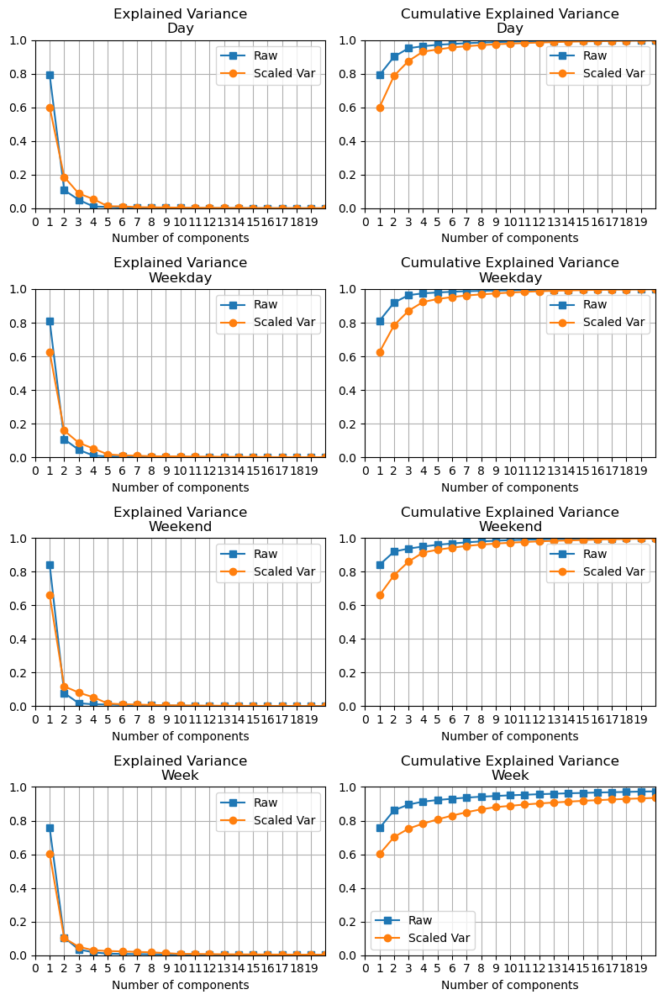

In [13]:
def plotExplainedVariances(fitted_pipelines,axs):
    marker_cycle = itertools.cycle(('s', 'o', '^', '*')) 
    for pipeline_name,pipeline in fitted_pipelines.items():
        pca = get_pca_from_pipeline(pipeline)
        explained_variance = pca.explained_variance_ratio_
        cumulative_variance = np.cumsum(explained_variance)

        marker = next(marker_cycle)
        
        axs[0].plot(np.arange(1,len(explained_variance)+1),explained_variance,marker=marker)
        axs[1].plot(np.arange(1,len(cumulative_variance)+1),cumulative_variance,marker=marker)
        
    axs[0].set_title('Explained Variance')
    axs[1].set_title('Cumulative Explained Variance')
    for ax in axs:
        ax.set_ylim(0,1)
        ax.legend(fitted_pipelines.keys())
        ax.set_xlim([0,20])
        ax.set_xticks(np.arange(20))
        ax.set_xlabel('Number of components')
        ax.grid()

        
fig,axs = plt.subplots(len(datasets),2,figsize=(8,12))
i=0
for dataset_name,ps in pipelines_fitted.items():
    plotExplainedVariances(ps, axs[i,:])
    axs[i,0].set_title(axs[i,0].get_title() + f"\n{dataset_name}")
    axs[i,1].set_title(axs[i,1].get_title() + f"\n{dataset_name}")
    i+=1
plt.tight_layout()

What do we see here?
* Most of the variance in the data is explained in the first principal component, after around 3 components we are already explaining about 90% of the variance of the data!
* Scaling the variance makes everything much harder. We have to put more effort into explaining the details of the early hours and need more principal components to explain the data.

Lets ignore the scaled variance approach then.

Lets compare these different datasets.

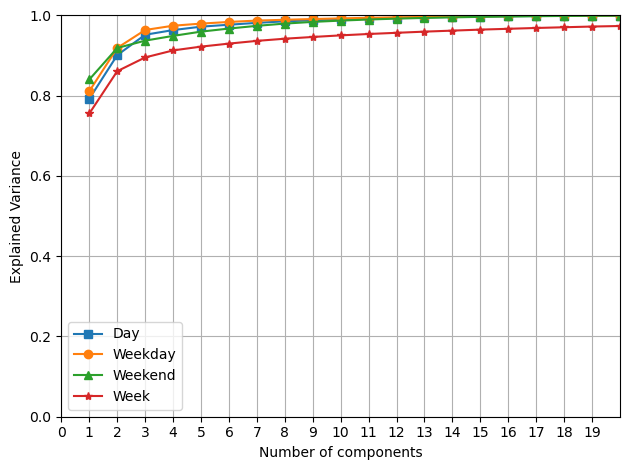

In [14]:
fig,axs = plt.subplots(1,1)
marker_cycle = itertools.cycle(('s', 'o', '^', '*')) 
for dataset_name,ps in pipelines_fitted.items():
    pca = get_pca_from_pipeline(ps['Raw'])
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)
    marker = next(marker_cycle)
    axs.plot(np.arange(1,len(cumulative_variance)+1),cumulative_variance,marker=marker)
    
axs.set_ylim(0,1)
axs.legend(datasets.keys())
axs.set_xlim([0,20])
axs.set_xticks(np.arange(20))
axs.set_xlabel('Number of components')
axs.set_ylabel('Explained Variance')
axs.grid()
plt.tight_layout()


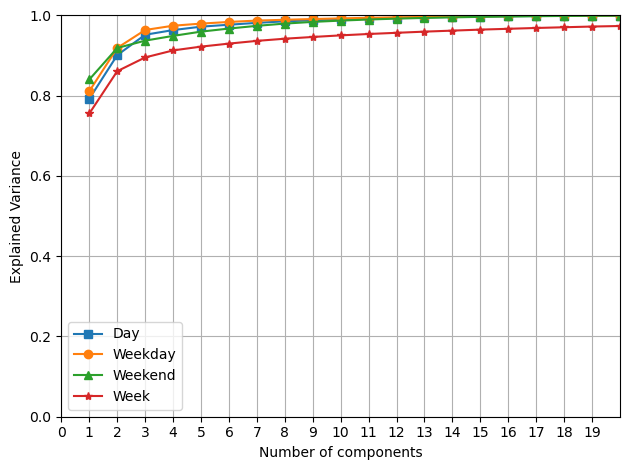

In [15]:
fig,axs = plt.subplots(1,1)
marker_cycle = itertools.cycle(('s', 'o', '^', '*')) 
for dataset_name,ps in pipelines_fitted.items():
    pca = get_pca_from_pipeline(ps['Raw'])
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)
    marker = next(marker_cycle)
    axs.plot(np.arange(1,len(cumulative_variance)+1),cumulative_variance,marker=marker)
    
axs.set_ylim(0,1)
axs.legend(datasets.keys())
axs.set_xlim([0,20])
axs.set_xticks(np.arange(20))
axs.set_xlabel('Number of components')
axs.set_ylabel('Explained Variance')
axs.grid()
plt.tight_layout()


Plot for publication

In [16]:
fig,axs = plt.subplots(1,1)
marker_cycle = itertools.cycle(('s', 'o', '^', '*'))
pipelines_plot = {k:pipelines_fitted[k] for k in ['Day','Week']}
for dataset_name,ps in pipelines_plot.items():
    pca = get_pca_from_pipeline(ps['Raw'])
    explained_variance = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance)
    marker = next(marker_cycle)
    axs.plot(np.arange(1,len(cumulative_variance)+1),cumulative_variance,marker=marker)
    axs.set_ylim(0,1)
axs.legend(pipelines_plot.keys())
axs.set_xlim([0,20])
axs.set_xticks(np.arange(25))
axs.set_yticks(np.arange(0,1.1,0.1))
axs.set_ylim(0,1.05)
axs.set_xlim(0.5,24.5)
axs.set_xlabel('Number of components')
axs.set_ylabel('Cumulative Explained Variance Ratio')
axs.grid()
plt.tight_layout()
plt.savefig('Plots/PCA/CumulativeExplainedVariance.pdf')
plt.close()

In [17]:
fig,axs = plt.subplots(1,1)
marker_cycle = itertools.cycle(('s', 'o', '^', '*'))
pipelines_plot = {k:pipelines_fitted[k] for k in ['Day','Week']}
for dataset_name,ps in pipelines_plot.items():
    pca = get_pca_from_pipeline(ps['Raw'])
    explained_variance = pca.explained_variance_ratio_
#    cumulative_variance = np.cumsum(explained_variance)
    marker = next(marker_cycle)
    axs.plot(np.arange(1,len(explained_variance)+1),explained_variance,marker=marker)
    axs.set_ylim(0,1)
axs.legend(pipelines_plot.keys())
axs.set_xlim([0,20])
axs.set_xticks(np.arange(25))
axs.set_yticks(np.arange(0,1.1,0.1))
axs.set_ylim(0,1.05)
axs.set_xlim(0.5,24.5)
axs.set_xlabel('Number of components')
axs.set_ylabel('Explained Variance Ratio')
axs.grid()
plt.tight_layout()
plt.savefig('Plots/PCA/ExplainedVariance.pdf')
plt.close()

What do we see here. We can think about this in terms of *ease of explanations*. 

How many components do we need to explain the data. In order of easyness (easiest to hardest).

1. Weekdays
2. Days.
3. Weekends.
4. Weeks

This means that with (for example) 3 components. We explain more the variance, over all the locations, of weekday behaviour than daily behaviour. This makes sense, the day behaviour contains both week and weekday behaviour. Weeks the most difficult to explain (lower explained variance with 3 components) again this makes sense, there is more data there and more combinations of weekday and weekend behaviour that are possible. The weekdays and easier to explain than the the weekends, it isn't immediately clear why this be

## Inspecting the projections

What does this all mean?
Lets take our daily data and inspect the principal components.
When we reconstruct from our transformed components, remember we add back the mean so lets look at that as well.

In [18]:
arr = day_array
labels = day_labels
dates =  day_dates
pipeline1 = Pipeline([
    ('pca', PCA())  
])

fitted = pipeline1.fit_transform(arr)
pca = get_pca_from_pipeline(pipeline1)
comps = pca.components_

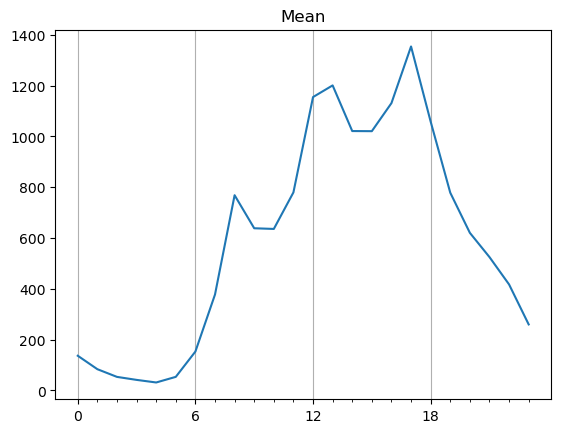

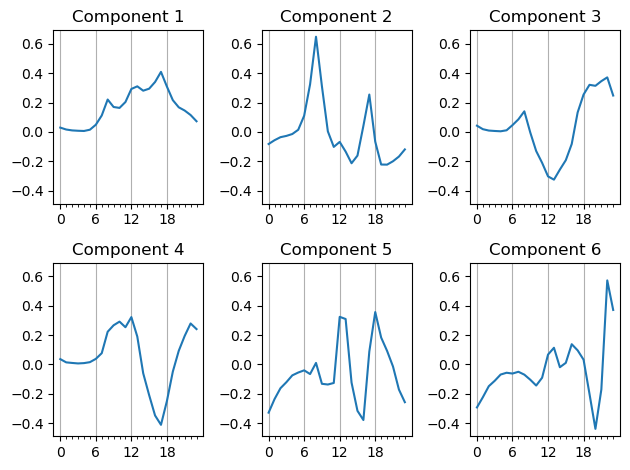

In [19]:
def linkYlims(axs):
    ymin = min(ax.get_ylim()[0] for ax in axs) 
    ymax = max(ax.get_ylim()[1] for ax in axs) 
    for ax in axs:
        ax.set_ylim(ymin, ymax)

fig,ax = plt.subplots(1,1)
ax.plot(np.mean(arr,axis=0))
ax.set_title('Mean')
ax.set_xticks(range(0, 24, 6))
ax.set_xticks(range(0, 24), minor=True)
ax.grid(which='major', axis='x', linestyle='-')
        
fig,axs = plt.subplots(2,3)
axs = axs.flatten()
for ax,row,c in zip(axs,comps,itertools.count(1)):
    ax.plot(row)
    ax.set_title(f"Component {c}")
    ax.set_xticks(range(0, 24, 6))
    ax.set_xticks(range(0, 24), minor=True)
    ax.grid(which='major', axis='x', linestyle='-')

linkYlims(axs)
plt.tight_layout()

The mean shows the *common* behaviour across all the different days. We see three peaks across the day at 8, 12 and 17, which we can associate with morning commutes, lunch-time activity and evening commutes.

This is quite interesting. I see some patterns in this.
* **Component 1**: This looks a lot like the mean. Adding or subtracting this would account for general *busyness* during the day.
* **Component 2**: This exaggerates the early morning and late afternoon peaks.
* **Component 3**: Decreases the midday counts.
* **Component 4**: Decreases the late afternoon peaks.

The higher components are less easy to give a clear story to.

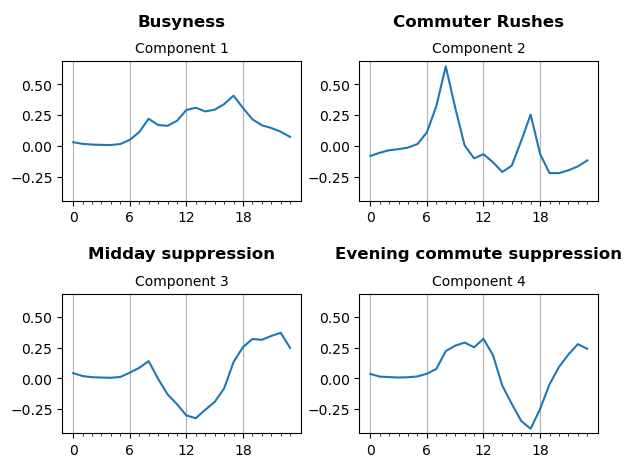

In [20]:
# For inclusion in presentations.

descs = ['Busyness','Commuter Rushes','Midday suppression','Evening commute suppression']
fig,axs = plt.subplots(2,2)
axs = axs.flatten()
for ax,row,c,desc in zip(axs,comps,itertools.count(1),descs):
    ax.plot(row)
    ax.set_title(f"\n\nComponent {c}",fontsize=10)
    ax.text(0.5, 1.25, desc, transform=ax.transAxes, ha='center', fontweight='bold',fontsize=12)
    ax.set_xticks(range(0, 24, 6))
    ax.set_xticks(range(0, 24), minor=True)
    ax.grid(which='major', axis='x', linestyle='-')

linkYlims(axs)
plt.tight_layout()
plt.savefig('Daily_comps.png')

In [21]:
# For inclusion in publications

for row,c in zip(comps[:6,:],itertools.count(1)):
    fig,ax = plt.subplots(1,1)
    ax.plot(row)
#    ax.set_title(f"\n\nComponent {c}",fontsize=10)
#    ax.text(0.5, 1.25, desc, transform=ax.transAxes, ha='center', fontweight='bold',fontsize=12)
    ax.set_xticks(range(0, 24, 6))
    ax.set_xticks(range(0, 24), minor=True)
    ax.set_ylim(-0.7,0.7)
    ax.grid(which='major', axis='x', linestyle='-')

    plt.tight_layout()
    plt.savefig(f"Plots/PCA/DailyComps_{c:02d}.pdf")
    plt.close()

Lets take a look at some of the daily counts what components they have.


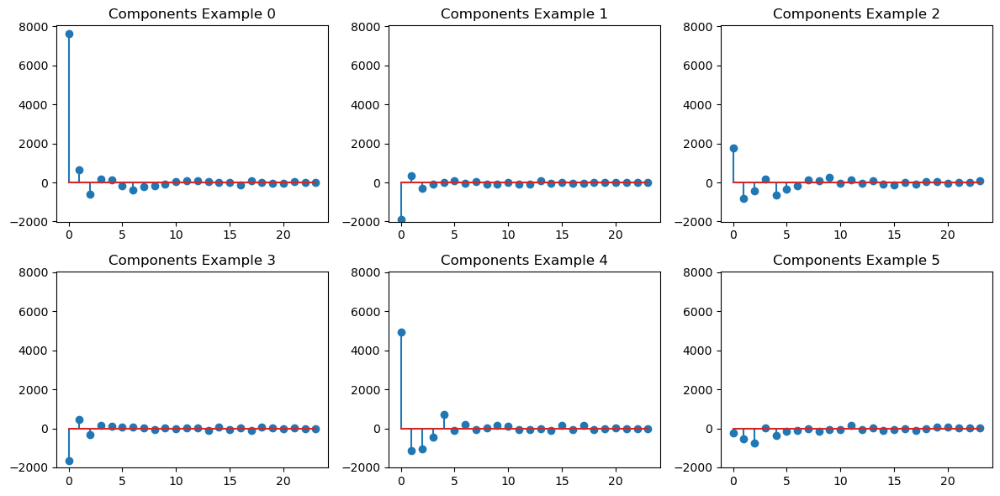

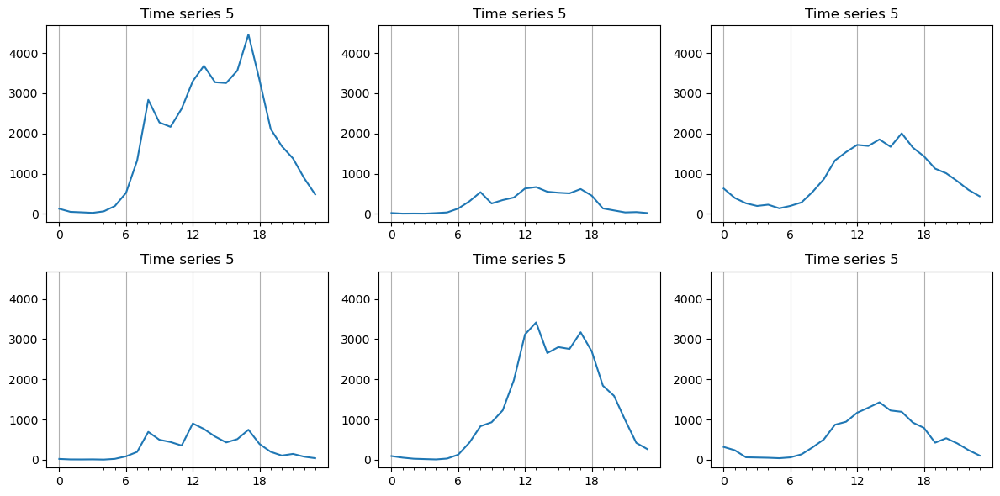

In [22]:
total_rows = len(fitted)
rng = np.random.default_rng(seed=0)
inds = rng.choice(total_rows, N, replace=False)

fig,axs = plt.subplots(2,3,figsize=(12,6))
axs = axs.flatten()
for ax,row,c in zip(axs,fitted[inds,:],itertools.count()):
    ax.stem(row)
    ax.set_title(f"Components Example {c}")
linkYlims(axs)

plt.tight_layout()
fig,axs = plt.subplots(2,3,figsize=(12,6))
axs = axs.flatten()
for ax,row in zip(axs,arr[inds,:]):
    ax.plot(row)
    ax.set_title(f"Time series {c}")
    ax.set_xticks(range(0, 24, 6))
    ax.set_xticks(range(0, 24), minor=True)
    ax.grid(which='major', axis='x', linestyle='-')
linkYlims(axs)
plt.tight_layout()

Lets look at a reconstruction of a particular day and see how these components are used.
This site / day was chosen to have a strong peak in the second component.

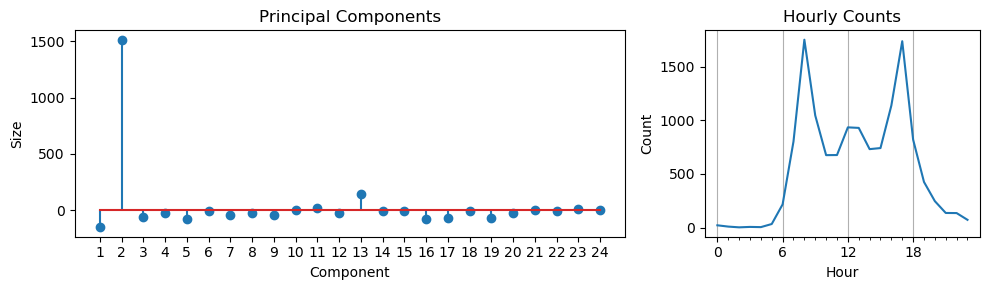

In [23]:
ind = 6450

fig = plt.figure(figsize=(10, 3))
gs = gridspec.GridSpec(1, 2, width_ratios=[2, 1])

ax0 = plt.subplot(gs[0])
ax0.stem(np.arange(0, 24) + 1, fitted[ind, :])
ax0.set_xticks(np.arange(0, 24) + 1)
ax0.set_xlabel('Component')
ax0.set_ylabel('Size')
ax0.set_title('Principal Components')

ax1 = plt.subplot(gs[1])
ax1.plot(arr[ind, :])
ax1.set_xlabel('Hour')
ax1.set_ylabel('Count')
ax1.set_title('Hourly Counts')
ax1.set_xticks(range(0, 24, 6))
ax1.set_xticks(range(0, 24), minor=True)
ax1.grid(which='major', axis='x', linestyle='-')

plt.tight_layout()
plt.show()

For the paper: Lets look at the components for the four case study locations and two paticular days

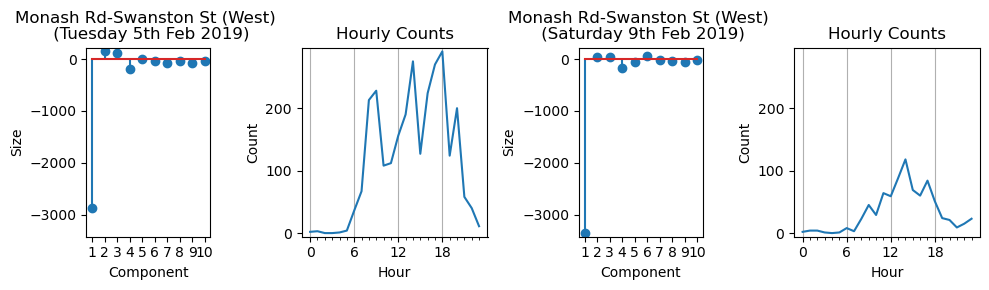

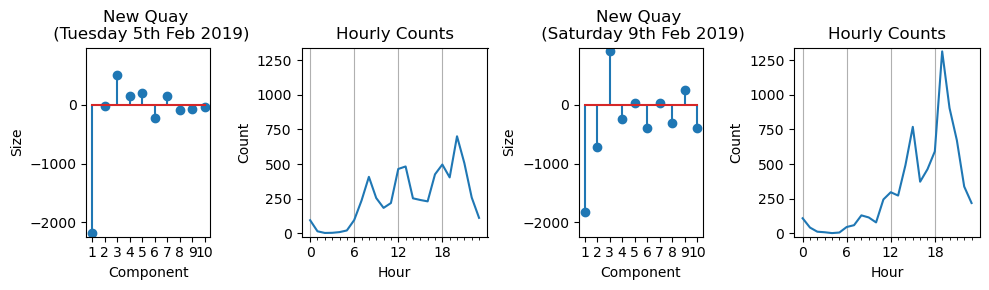

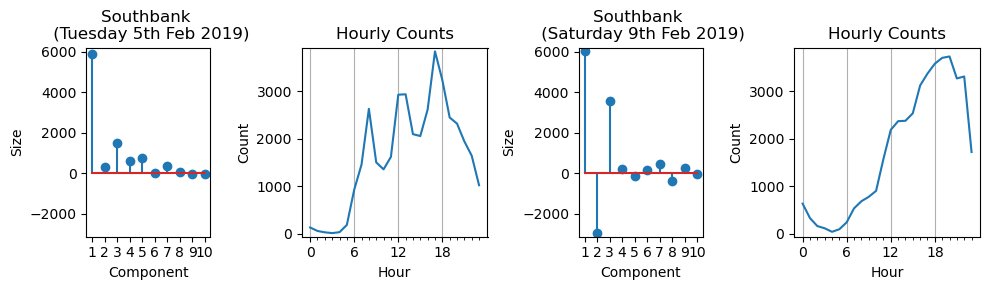

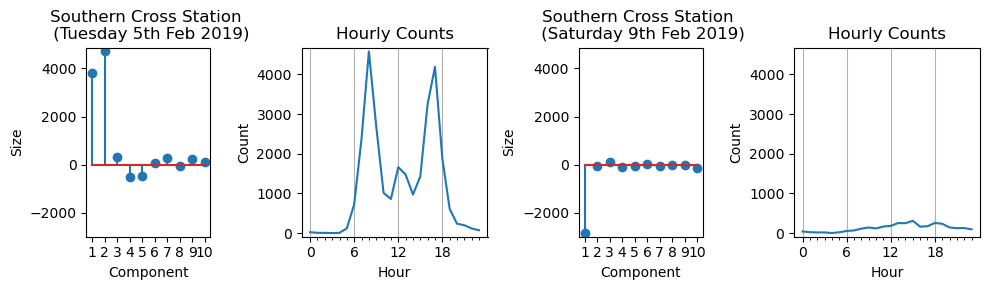

In [24]:
num_components_to_show = 10

for area in case_studies:
    fig = plt.figure(figsize=(10, 3))  # Increased figure size
    gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1.5, 1, 1.5])  # Grid with 4 columns

    # Determine the indices for both dates    
    # First date: 2019,2,5
    ind_1 = day_indices.loc[(day_indices.day_labels==area) & (day_indices.day_dates==datetime.date(2019,2,5)),:].index[0]
    # Second date: 2019,2,9
    ind_2 = day_indices.loc[(day_indices.day_labels==area) & (day_indices.day_dates==datetime.date(2019,2,9)),:].index[0]

    # Determine the y-axis limits for the stem plots
    stem_y_min = min(fitted[ind_1, :].min(), fitted[ind_2, :].min())
    stem_y_max = max(fitted[ind_1, :].max(), fitted[ind_2, :].max())
    stem_range = stem_y_max - stem_y_min
    stem_y_min -= 0.02 * stem_range  # Decrease min limit by a small percentage
    stem_y_max += 0.02 * stem_range  # Increase max limit by a small percentage

    # Determine the y-axis limits for the line plots
    line_y_min = min(arr[ind_1, :].min(), arr[ind_2, :].min())
    line_y_max = max(arr[ind_1, :].max(), arr[ind_2, :].max())
    line_range = line_y_max - line_y_min
    line_y_min -= 0.02 * line_range  # Decrease min limit by a small percentage
    line_y_max += 0.02 * line_range  # Increase max limit by a small percentage

    # Plots for the first day - component (stem) plot followed by hourly counts (line) plot
    ax0 = plt.subplot(gs[0])
    ax0.stem(np.arange(0, num_components_to_show) + 1, fitted[ind_1, :num_components_to_show])
    ax0.set_ylim(stem_y_min, stem_y_max)
    ax0.set_xticks(np.arange(0, num_components_to_show) + 1)
    ax0.set_xlabel('Component')
    ax0.set_ylabel('Size')
    ax0.set_title(f'{area} \n (Tuesday 5th Feb 2019)')

    ax1 = plt.subplot(gs[1])
    ax1.plot(arr[ind_1, :])
    ax1.set_ylim(line_y_min, line_y_max)
    ax1.set_xlabel('Hour')
    ax1.set_ylabel('Count')
    ax1.set_title(f'Hourly Counts')
    ax1.set_xticks(range(0, 24, 6))
    ax1.set_xticks(range(0, 24), minor=True)
    ax1.grid(which='major', axis='x', linestyle='-')

    # Plots for the second day
    ax2 = plt.subplot(gs[2])
    ax2.stem(np.arange(0, num_components_to_show) + 1, fitted[ind_2, :num_components_to_show])
    ax2.set_ylim(stem_y_min, stem_y_max)
    ax2.set_xticks(np.arange(0, num_components_to_show) + 1)
    ax2.set_xlabel('Component')
    ax2.set_ylabel('Size')
    ax2.set_title(f'{area} \n (Saturday 9th Feb 2019)')

    ax3 = plt.subplot(gs[3])
    ax3.set_ylim(line_y_min, line_y_max)
    ax3.plot(arr[ind_2, :])
    ax3.set_xlabel('Hour')
    ax3.set_ylabel('Count')
    ax3.set_title(f'Hourly Counts')
    ax3.set_xticks(range(0, 24, 6))
    ax3.set_xticks(range(0, 24), minor=True)
    ax3.grid(which='major', axis='x', linestyle='-')

    plt.tight_layout()
    plt.savefig(f"Plots/PCA/DailyComps-{area}.pdf")
    
plt.show()

Now lets reconstruct the original time series piece by piece.

Going column by column:
1. We start with the mean.
2. We include the first component (the busyness). This has a negative contribution.
3. We include the second component (the commuter rushes). This has a large positive contribution. We have mostly reconstructed the original series.
4. We include the third component. This has a very small contribution and changes the final result very little.

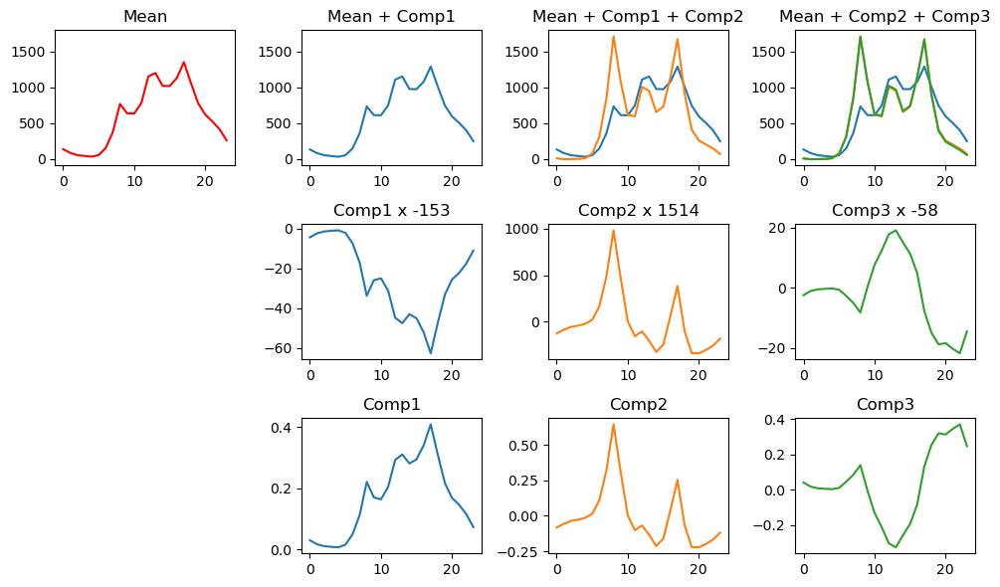

In [25]:
recon = arr.mean(axis=0) + np.cumsum( fitted[ind,:]*comps.T ,axis=1 ).T

fig,axs = plt.subplots(3,4,figsize=(10,6))
color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']

axs[0,0].plot(arr.mean(axis=0),color='r' )
for i in range(1,4):
    axs[0,i].plot(recon[:i,:].T)


ts = ['Mean','Mean + Comp1',"Mean + Comp1 + Comp2","Mean + Comp2 + Comp3"]

for ax,t in zip( axs[0,:],ts ):
    ax.set_title(t)

def linkYlims(axs):
    maxs = np.max( [ax.get_ylim()[1] for ax in axs] )
    mins = np.min( [ax.get_ylim()[0] for ax in axs])
    for ax in axs:
        ax.set_ylim([mins,maxs])

for i in range(1,4):
    color = color_cycle[i-1 % len(color_cycle)] 
    axs[1,i].plot(fitted[ind,i-1]*comps[i-1,:],color=color)
    axs[1,i].set_title(f"Comp{i} x {int(fitted[ind,i-1])}")


    
for i in range(1,4):
    color = color_cycle[i-1 % len(color_cycle)] 
    axs[2,i].plot(comps[i-1,:],color=color)
    axs[2,i].set_title(f"Comp{i}")


#print(axs.shape)
linkYlims(axs[0,:] )
axs[1, 0].set_visible(False) 
axs[2, 0].set_visible(False) 

plt.tight_layout()

## Plotting the components in the transformed space

The hope here is that we might be able to visualise clusters in the space. 

(*Note that the figure is not produced; uncomment the last lines in the second chunk to do this*).

In [26]:
arr = day_array
labels = day_labels

pipeline1 = Pipeline([
    ('pca', PCA())  
])

fitted = pipeline1.fit_transform(arr)
pca = get_pca_from_pipeline(pipeline1)
comps = pca.components_

plotly_markers = ['circle', 'square', 'diamond']

comps_plots = [1, 2, 3]
unique_labels = np.unique(labels)

In [27]:
# Create a scatter plot for each label
traces = []
sample = 0.3 # Only display some of the points for clarity. 1.0=display all. 0.0=display none

# Colour map for consistent colours across sensors
color_map = px.colors.qualitative.Plotly  # Or any other color sequence
label_colors = {label: color_map[idx % len(color_map)] for idx, label in enumerate(unique_labels)}


for idx, label in enumerate(unique_labels):
    if random.random() < sample:
        data_for_label = fitted[labels == label]
        trace = go.Scatter3d(
            x=data_for_label[::1, comps_plots[0]-1],
            y=data_for_label[::1, comps_plots[1]-1],
            z=data_for_label[::1, comps_plots[2]-1],
            mode='markers',
            marker=dict(symbol=plotly_markers[idx % len(plotly_markers)], size=2,
                       color=label_colors[label]),
            name=str(label),
        )
        traces.append(trace)
descs = ['Busyness','Commuter Rushes','Lunchtime suppression','Evening commute suppression']
# Create the layout
layout = go.Layout(
    scene=dict(
        xaxis_title=f"{descs[comps_plots[0]-1]} <br>   comp{comps_plots[0]}",
        yaxis_title=f"{descs[comps_plots[1]-1]} <br>       comp{comps_plots[1]}",
        zaxis_title=f"{descs[comps_plots[2]-1]} <br>         comp{comps_plots[2]}",
        # Optionally set ranges for the axes to focus on the more interesting central areas
        xaxis=dict(range=[-5000, 10000]),  # set range for x-axis (busyness)
        yaxis=dict(range=[-5000, 8000]),  # set range for y-axis
        zaxis=dict(range=[-5000, 5000]),  # set range for z-axis
    ),
    showlegend=False,
    width=800,  # Adjust as needed
    height=700   # Adjust as needed
)

# Create the figure and display it
#fig = go.Figure(data=traces, layout=layout)
#fig.show()
#write_html(fig, 'UrbanUsageSpaceDemoDays.html')

Lets do two 2D graphs to aid interpretation of the 3D one.

In [28]:
from plotly.subplots import make_subplots

# Create a subplot with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Loop over both subplots
for subplot in [1,2]:
    # Add traces
    for idx, label in enumerate(unique_labels):
        data_for_label = fitted[labels == label]
        fig.add_trace(
            go.Scatter(
                x=data_for_label[::1, comps_plots[0]-1],
                y=data_for_label[::1, comps_plots[subplot]-1],
                mode='markers',
                marker=dict(symbol=plotly_markers[idx % len(plotly_markers)], size=2, opacity=0.5,
                           color=label_colors[label]),
                name=str(label),
                
            ),
            row=1, col=subplot
        )

    # Update axes labels 
    fig.update_xaxes(title_text=f"{descs[comps_plots[0]-1]} (comp{comps_plots[0]})",             row=1, col=subplot)
    fig.update_yaxes(title_text=f"{descs[comps_plots[subplot]-1]} (comp{comps_plots[subplot]})", row=1, col=subplot, range=[-8000,10000])


# Update layout (if needed)
fig.update_layout(
    height=450,  # Adjust the height as needed
    width=1000,  # Adjust the width as needed (should be larger to accommodate two plots)
    showlegend=False
)

# Show the figure
fig.write_image("Plots/PCA/Vis3D/Plot2DDailyAgg.png")
fig.show()

A second 3D plot, with only the case study locations selected initially (*Note that the figure is not produced; uncomment the last lines to do this*).

In [29]:
# Create a scatter plot for each label

traces = []
for idx, label in enumerate(unique_labels):
    data_for_label = fitted[labels == label]
    trace = go.Scatter3d(
        x=data_for_label[::1, comps_plots[0]-1],
        y=data_for_label[::1, comps_plots[1]-1],
        z=data_for_label[::1, comps_plots[2]-1],
        mode='markers',
        marker=dict(symbol=plotly_markers[idx % len(plotly_markers)], size=2,color=label_colors[label]),
        name=str(label),
        # Set only the case study locations to be initally visible
        visible= True if label in case_studies else 'legendonly',
    )
    traces.append(trace)
descs = ['Busyness','Commuter Rushes','Lunchtime suppression','Evening commute suppression']
# Create the layout
layout = go.Layout(
    scene=dict(
        xaxis_title=f"{descs[comps_plots[0]-1]} <br>   comp{comps_plots[0]}",
        yaxis_title=f"{descs[comps_plots[1]-1]} <br>       comp{comps_plots[1]}",
        zaxis_title=f"{descs[comps_plots[2]-1]} <br>         comp{comps_plots[2]}",
        # Optionally set ranges for the axes to focus on the more interesting central areas
        #xaxis=dict(range=[-5000, 10000]),  # set range for x-axis (busyness)
        #yaxis=dict(range=[-5000, 8000]),  # set range for y-axis (commuting)
        zaxis=dict(range=[-2000, 6000]),  # set range for z-axis (lunchtime suppression)
    ),
    showlegend=True,
    width=1000,  # Adjust as needed
    height=800   # Adjust as needed
)

# Create the figure and display it
#fig = go.Figure(data=traces, layout=layout)
#fig.show()

2D graphs just for the case study areas

In [30]:
from plotly.subplots import make_subplots

# Create a subplot with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Loop over both subplots
for subplot in [1,2]:
    # Add traces
    for idx, label in enumerate(unique_labels):
        if label in case_studies:
            data_for_label = fitted[labels == label]
            fig.add_trace(
                go.Scatter(
                    x=data_for_label[::1, comps_plots[0]-1],
                    y=data_for_label[::1, comps_plots[subplot]-1],
                    mode='markers',
                    marker=dict(symbol=plotly_markers[idx % len(plotly_markers)], size=5, opacity=0.5,
                               color=label_colors[label]),
                    name=str(label),
                    showlegend=(subplot == 1)  # Show legend only for the first subplot
                ),
                row=1, col=subplot
            )

    # Update axes labels 
    fig.update_xaxes(title_text=f"{descs[comps_plots[0]-1]} (comp{comps_plots[0]})",
                     row=1, col=subplot, range=[-5000,10000])
    fig.update_yaxes(title_text=f"{descs[comps_plots[subplot]-1]} (comp{comps_plots[subplot]})",
                     row=1, col=subplot, range=[-5000,6000])

# Manually adjust the domain of each x-axis (to prevent overlap)
fig.update_xaxes(domain=[0.0, 0.42], row=1, col=1)
fig.update_xaxes(domain=[0.58, 1.0], row=1, col=2)


# Update layout (if needed)
fig.update_layout(
    height=450,  # Adjust the height as needed
    width=1000,  # Adjust the width as needed (should be larger to accommodate two plots)
    showlegend=True,
    legend=dict(
        orientation='h',  # Horizontal orientation
        x=0.5,  # X position (0.5 for center)
        y=1.1,  # Y position (just above the plot area)
        xanchor='center',  # Center the legend at the X position
        yanchor='bottom'   # Anchor the legend at the bottom of the legend box
    )
)

# Show the figure
fig.write_image("Plots/PCA/Vis3D/Plot2DDailyAgg-CaseStudies.png")
fig.show()

Lets look at the relationship between _busyness_ and _commuter rushes_ in Southbank in more detail

In [31]:


# Assuming 'fitted', 'labels', 'unique_labels', 'plotly_markers', 'label_colors', and 'descs' are predefined

label = "Southbank"
idx = np.where(unique_labels == label)[0][0]
data_for_label = fitted[labels == label]

fig = go.Figure(
    go.Scatter(
        x=data_for_label[:, comps_plots[0]-1],
        y=data_for_label[:, comps_plots[1]-1],
        mode='markers',
        marker=dict(
            symbol=plotly_markers[idx % len(plotly_markers)],
            size=5,
            opacity=0.5,
            color=label_colors[label]
        ),
        name=str(label)
    )
)

# Update axes labels
fig.update_xaxes(title_text=f"{descs[comps_plots[0]-1]} (comp{comps_plots[0]})")
fig.update_yaxes(title_text=f"{descs[comps_plots[1]-1]} (comp{comps_plots[1]})")

# Update layout
fig.update_layout(
    height=450,  # Adjust the height as needed
    width=1000,  # Adjust the width as needed
    showlegend=True,
)

# Show the figure
fig.show()

It is possible that the points are clustering around three distinct diagonal lines. I have tried to make an interactive plot in this notbook so that I can select these clusters, but I couldn't get the interaction to fill in the list of selected points. Instead, use a separate script called "_03a PCA Analysis-interactive plot.py_".

First, write out the `x` and `y` data so the script can read it:

In [32]:
# Write out the x and y data
with open(os.path.join('temp', 'x.pickle'), 'wb') as file:
    pickle.dump(data_for_label[::1, comps_plots[0]-1], file)

with open(os.path.join('temp', 'y.pickle'), 'wb') as file:
    pickle.dump(data_for_label[::1, comps_plots[1]-1], file)
    

Now run _03a PCA Analysis-interactive plot.py_ using normal python (code below for info). It will create a Plotly Dash app that starts a server that you need to connect to in a browser (e.g. at http://127.0.0.1:8050/).

I did that and manually selected the following three clusters. Before continuing make sure there are no overlapping points (I didn't select them perfectly) and then go on to analyse them

In [33]:
cluster1 = [6, 7, 8, 9, 10, 13, 14, 15, 16, 17, 20, 21, 22, 23, 27, 28, 29, 30, 31, 34, 35, 36, 37, 38, 41, 42, 43, 44, 45, 48, 49, 50, 51, 52, 55, 56, 57, 58, 59, 62, 63, 64, 65, 66, 70, 71, 72, 73, 76, 77, 78, 79, 80, 83, 84, 85, 86, 91, 92, 93, 94, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 111, 112, 114, 115, 118, 119, 120, 121, 122, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 139, 140, 141, 142, 143, 146, 147, 148, 149, 150, 153, 154, 155, 156, 157, 161, 162, 163, 164, 167, 168, 169, 170, 171, 174, 175, 176, 177, 178, 181, 182, 183, 184, 185, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 202, 203, 204, 205, 206, 209, 210, 211, 212, 213, 216, 217, 218, 219, 220, 223, 224, 225, 226, 227, 230, 231, 232, 233, 234, 237, 238, 239, 240, 241, 244, 245, 246, 247, 248, 251, 252, 253, 254, 255, 258, 259, 260, 261, 262, 265, 266, 267, 268, 272, 273, 274, 275, 276, 279, 280, 281, 282, 283, 286, 287, 288, 289, 290, 293, 294, 295, 296, 297, 300, 301, 302, 303, 304, 307, 309, 310, 311, 314, 315, 316, 317, 318, 321, 322, 323, 324, 325, 328, 329, 330, 331, 332, 335, 336, 337, 338, 339, 342, 343, 344, 345, 346, 349, 350, 351, 352, 353, 370, 371, 372, 373, 374, 377, 378, 379, 380, 381, 384, 385, 386, 387, 399, 400, 401, 405, 406, 407, 408, 409, 412, 413, 414, 415, 416, 419, 420, 421, 426, 427, 428, 429, 434, 435, 436, 437, 440, 441, 442, 443, 444, 447, 448, 449, 450, 451, 455, 456, 457, 458, 461, 462, 463, 464, 465, 468, 469, 470, 471, 506]

cluster2 = [0, 1, 2, 3, 54, 69, 75, 95, 113, 131, 207, 208, 235, 257, 270, 271, 277, 285, 307, 327, 346, 365, 366, 367, 382, 383, 388, 392, 393, 394, 395, 398, 399, 401, 402, 405, 409, 416, 419, 422, 423, 430, 437, 444, 446, 454, 463, 465, 476, 477, 478, 479, 482, 483, 484, 485, 486, 489, 490, 491, 492, 493, 495, 496, 497, 498, 499, 500, 503, 504, 505, 507, 510, 511, 512, 513, 514, 517, 518, 519, 520, 521, 525, 526, 527, 528, 531, 532, 533, 534, 535, 538, 539, 540, 541, 542, 545, 546, 547, 548, 549, 552, 553, 554, 555, 556, 559, 560, 561, 562, 563, 566, 567, 568, 569, 570, 572, 573, 574, 575, 576, 577, 580, 581, 582, 583, 584, 587, 588, 589, 590, 591, 593, 594, 595, 596, 597, 598, 601, 602, 603, 604, 605, 608, 609, 610, 611, 612, 615, 616, 617, 618, 619, 621, 622, 623, 624, 625, 626, 629, 630, 631, 632, 636, 637, 638, 639, 640, 643, 644, 645, 646, 647, 650, 651, 652, 653, 654, 657, 658, 659, 660, 661, 664, 665, 666, 667, 668, 671, 673, 674, 675, 678, 679, 680, 681, 682, 685, 686, 687, 688, 689, 692, 693, 694, 695, 696, 699, 700, 701, 702, 703, 706, 707, 708, 709, 710, 713, 714, 715, 716, 717]

cluster3 = [3, 4, 5, 11, 12, 18, 19, 24, 25, 26, 32, 33, 39, 40, 46, 47, 53, 54, 60, 61, 67, 68, 69, 74, 75, 81, 82, 87, 88, 89, 90, 95, 96, 102, 103, 109, 110, 113, 116, 117, 123, 124, 130, 131, 137, 138, 144, 145, 151, 152, 158, 159, 160, 165, 166, 172, 173, 179, 180, 186, 187, 193, 194, 200, 201, 207, 214, 215, 221, 222, 228, 229, 235, 236, 242, 243, 249, 250, 256, 263, 264, 269, 270, 271, 277, 278, 284, 285, 291, 292, 298, 299, 305, 306, 308, 312, 313, 319, 320, 326, 327, 333, 334, 340, 341, 347, 348, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 375, 376, 382, 383, 389, 390, 391, 396, 397, 403, 404, 410, 411, 417, 418, 424, 425, 431, 432, 433, 438, 439, 445, 446, 452, 453, 459, 460, 466, 467, 472, 473, 474, 475, 478, 479, 480, 481, 487, 488, 494, 495, 501, 502, 508, 509, 515, 516, 522, 523, 524, 529, 530, 536, 537, 543, 544, 550, 551, 557, 558, 564, 565, 571, 578, 579, 585, 586, 592, 593, 599, 600, 606, 607, 613, 614, 620, 627, 628, 633, 634, 635, 641, 642, 648, 649, 655, 656, 662, 663, 669, 670, 672, 676, 677, 683, 684, 690, 691, 697, 698, 704, 705, 711, 712, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728]

print("Read three arrays with lengths", len(cluster1), len(cluster2), len(cluster3),
      ", total", len(cluster1) + len(cluster2) + len(cluster3))

# Check we got all of the points and if not, do some diagnostics
if len(set(cluster1 + cluster2 + cluster3)) < len(data_for_label): # MIssing some points
    print(f"We got fewer points than in the original data: {len(set(cluster1 + cluster2 + cluster3))} < {len(data_for_label[::1, comps_plots[0]-1])}")
    missing = list(set(range(len(data_for_label))) - set(cluster1 + cluster2 + cluster3))
    print("The missing points are", missing)
    fig = go.Figure()
    # Plot all points
    fig.add_trace(go.Scatter(x=data_for_label[::1, comps_plots[0]-1], y=data_for_label[::1, comps_plots[1]-1],
                             mode='markers', marker=dict(color='blue')))
    # Plot the missing
    fig.add_trace(go.Scatter(x=data_for_label[missing, comps_plots[0]-1], y=data_for_label[missing, comps_plots[1]-1],
                             mode='markers', marker=dict(color='red')))
    fig.show()
    assert False, "Cannot continue without the right number of points"

elif len(set(cluster1 + cluster2 + cluster3)) > len(data_for_label[::1, comps_plots[0]-1]):
    # Got too many! No idea what to do with this
    assert False, f"We got more points than in the original data: {len(set(cluster1 + cluster2 + cluster3))} > {len(data_for_label[::1, comps_plots[0]-1])}"
else:
    print("We got all the points")



Read three arrays with lengths 304 222 240 , total 766
We got all the points


In [34]:
# Check that each array is unique
for cluster in [cluster1, cluster2, cluster3]:
    assert len(set(cluster)) == len(cluster)

# Now make sure that no points are in more than one cluster, removing duplicates as necessary
# Prioritise cluster3, then 2, then 1
all_ids = set(cluster1 + cluster2 + cluster3)
all_ids = all_ids - set(cluster3)  # Remove cluster3 points, they wont be able to appear in clusters 1 or 2
cluster2 = list(all_ids & set(cluster2))  # Set cluster 2 so that it only has points that are still in all_ids
all_ids = all_ids - set(cluster2)
cluster1 = list(all_ids & set(cluster1))  # Set cluster 1 so that it only has the points after removing clusters 1 and 2

print("After removing duplicates, the lengths are", len(cluster1), len(cluster2), len(cluster3))

# Add up the lengths to make sure we have all the points
assert len(cluster1) + len(cluster2) + len(cluster3) == len(data_for_label[::1, comps_plots[0]-1]), f"Lengths don't add up: {len(cluster1)} + {len(cluster2)} + {len(cluster3)} != {len(data_for_label[::1, comps_plots[0]-1])}"


After removing duplicates, the lengths are 292 197 240


Plot the three clusters

In [35]:
# Assuming 'fitted', 'labels', 'unique_labels', 'plotly_markers', 'label_colors', and 'descs' are predefined

label = "Southbank"
idx = np.where(unique_labels == label)[0][0]
data_for_label = fitted[labels == label]

fig = go.Figure()
for i, cluster in enumerate([cluster1, cluster2, cluster3]):

    fig.add_trace(
        go.Scatter(
            x=data_for_label[cluster, comps_plots[0]-1],
            y=data_for_label[cluster, comps_plots[1]-1],
            mode='markers',
            marker=dict(
                symbol=plotly_markers[i % len(plotly_markers)],
                size=5,
                opacity=0.5,
                color=i
            ),
            name=f"Cluster {i+1}"
        )
    )

    # Update axes labels
    fig.update_xaxes(title_text=f"{descs[comps_plots[0]-1]} (comp{comps_plots[0]})")
    fig.update_yaxes(title_text=f"{descs[comps_plots[1]-1]} (comp{comps_plots[1]})")

    # Update layout
    fig.update_layout(
        height=450,  # Adjust the height as needed
        width=1000,  # Adjust the width as needed
        showlegend=True,
    )

# Show the figure
fig.show()
fig.write_image("Plots/PCA/Vis3D/Plot2DDailyAgg-Clusters.png")

Look at the traces for these three clusters. Code is slightly confusing so I'll explain. We are using an array called `fitted`, which has the results of the PCA (the components). Earlier we were using an array called `day_array` which had the traces. Those two arrays are the same shape. We extracted the components for just the case study location using `fitted[labels == label]` (where `label` is the name of the case study area). So to get the equivalent footfall traces we do simply `day_array[labels == label]`.

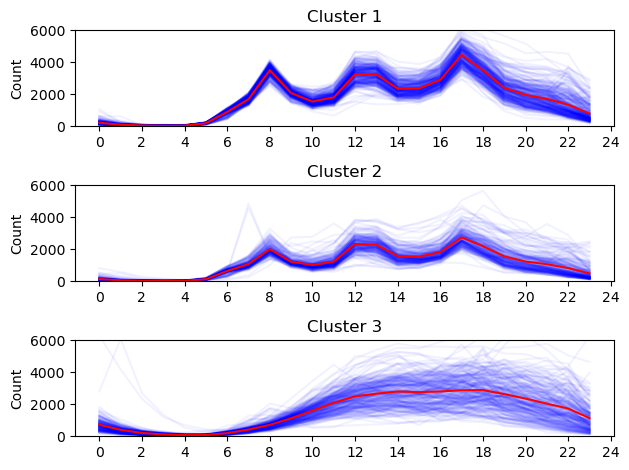

In [36]:
alpha=0.05

traces = day_array[labels == label] # The original traces with same index as the PCA data
assert traces.shape == data_for_label.shape

def plotAggregatedArray2(d,alpha,title,ax):
    """Slightly adapted to plot so that it looks the same as the one where we plotted
    the traces earlier"""
    ax.plot(d.T,'b-',alpha=alpha)
    ax.plot(np.mean(d,axis=0),'r')
    ax.set_ylabel('Count')
    ax.set_title(title)

fig,ax = plt.subplots(3,1)
for i, c in enumerate([cluster1, cluster2, cluster3]):
    plotAggregatedArray2(traces[c], alpha, f'Cluster {i+1}',ax[i])
    ax[i].set_xticks(np.arange(0,26,2))
    ax[i].set_ylim(0,6000)


plt.tight_layout()
plt.savefig("Plots/PCA/Vis3D/Plot2DDailyAgg-ClusterTraces.png")

## XXXX TO DELETE

Below are attempts to select the points from the graph, but I couldn't get it to work so use another approach.

In [ ]:
assert False, "Stopping"


In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np
from IPython.display import display

# Assuming necessary imports and data setup as per your provided code

# Initialize an empty list to store selected points
selected_points = []

# Create a FigureWidget rather than a static Figure
fig = make_subplots(rows=1, cols=1, specs=[[{"type": "scatter"}]])

# Your existing setup for traces, adapted for a FigureWidget
label = "Southbank"
idx = np.where(unique_labels == label)[0][0]

data_for_label = fitted[labels == label]

# Here we use a go.FigureWidget to make the figure interactive
scatter = go.Scatter(
    x=data_for_label[::1, comps_plots[0]-1],
    y=data_for_label[::1, comps_plots[1]-1],
    mode='markers',
    marker=dict(symbol=plotly_markers[idx % len(plotly_markers)], size=5, opacity=0.5,
                color=label_colors[label]),
    name=str(label),
)

fig.add_trace(scatter, row=1, col=1)

# Update axes and layout as in your original code
# ...

# Define a callback function for when points are selected
def selection_fn(trace, points, selector):
    # For this example, simply print selected points indices
    # You can modify this to append these indices to a list for further analysis
    for i in points.point_inds:
        print(i)  # Print index of selected point
        # Here you could append the selected point's data to `selected_points`
        selected_points.append((data_for_label[i, comps_plots[0]-1], data_for_label[i, comps_plots[1]-1]))

scatter.on_selection(selection_fn)

# Display the interactive figure
fig.show()

# At this point, `selected_points` will start to populate with points you select in the plot
# Remember: This will only work in a live Jupyter notebook environment


In [ ]:
# Global variable to store selected points
selected_points 

In [ ]:
# Function to be called when points are selected
def selection_fn(trace, points, selector):
    # Append selected points to the global list
    selected_points.extend(points.point_inds)

# Create a figure
fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter(
    x=data_for_label[::1, comps_plots[0]-1],
    y=data_for_label[::1, comps_plots[1]-1],
    mode='markers',
    marker=dict(size=5, opacity=0.5),
))

# Update layout to include selection tools
fig.update_layout(
    dragmode='lasso',  # or 'select' for box select
    newshape_line_color='cyan',
)

# Add callback for selection event
fig.data[0].on_selection(selection_fn)

fig.show()


In [ ]:
import plotly.graph_objects as go
import ipywidgets as widgets
from IPython.display import display

# Create an output widget to capture and display output
output_widget = widgets.Output()

# Function to be called when points are selected
def selection_fn(trace, points, selector):
    with output_widget:
        output_widget.clear_output()  # Clear the previous output
        print(points.point_inds)      # Print the indices of selected points

# Create a figure
fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter(
    x=data_for_label[::1, comps_plots[0]-1],
    y=data_for_label[::1, comps_plots[1]-1],
    mode='markers',
    marker=dict(size=5, opacity=0.5),
))

# Update layout to include selection tools
fig.update_layout(
    dragmode='lasso',  # or 'select' for box select
    newshape_line_color='cyan',
)

# Add callback for selection event
fig.data[0].on_selection(selection_fn)

# Display the figure and output widget
display(fig, output_widget)


In [ ]:
# List to store selected points
selected_points = []

In [ ]:
import plotly.graph_objects as go
import ipywidgets as widgets
from IPython.display import display



# Function to be called when points are selected
def selection_fn(trace, points, selector):
    #selected_points.clear()
    selected_points.extend(points.point_inds)

# Function to handle button click
def on_button_clicked(b):
    with output:
        output.clear_output()
        print("Selected points indices:", selected_points)

# Create a figure
fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter(
    x=data_for_label[::1, comps_plots[0]-1],
    y=data_for_label[::1, comps_plots[1]-1],
    mode='markers',
    marker=dict(size=5, opacity=0.5),
))

# Update layout to include selection tools
fig.update_layout(
    dragmode='lasso',  # or 'select' for box select
    newshape_line_color='cyan',
)

# Add callback for selection event
fig.data[0].on_selection(selection_fn)

# Create a button to display selected points
button = widgets.Button(description="Show Selected Points")
output = widgets.Output()

button.on_click(on_button_clicked)

# Display everything
display(fig)
display(button, output)


In [ ]:
selected_points

In [ ]:
display(output_widget)

In [ ]:
assert False

## Pause for thought

Lets plot the first PCA components for the daily data and have a close inspection of the plots

Lets remind ourselves what these components mean

* Component 1: General busyness
* Component 2: Increase in early morning and late afternoon peaks.
* Component 3: Decreases in the midday counts.

What do we see here.
* As component 1 increases. The spread off *all* points increases. This makes sense as the *busyness* increases so will the height of the morning, midday and evening peaks. This is a crude assessment we can look deeper.
* There are a large *wall* of points for which component 1 increases component 2 decreases!. i.e. as the place gets busier and its morning and evening rushes get smaller. This implies that they are experiencing an increase of people and its not work-activity related! This wall of components experiences both positive and negative component three.
* There is another group of points who as component 1 increases component 2 increases! i.e as the place gets busier and its morning and evening rushes increases. These places are Southern Cross and Bourke Street. Both transport hubs. They don't experience much variation in component 3 (lunch time rush).
* There is another region of points between these for which I can't come up with a good story at the moment.

## What about Weekly behaviour

So far we have looked at the *daily* behaviour. But what about the weekly behaviour? Can we see anything new there.
We will go a little quicker through this analysis.

In [ ]:
arr = week_array
labels = week_labels

pipeline1 = Pipeline([
    ('pca', PCA())  
])

fitted = pipeline1.fit_transform(arr)
pca = get_pca_from_pipeline(pipeline1)
comps = pca.components_

The mean shows a similar behaviour to what we saw during for the daily data, we have three peaks each day. We also have a lower peak at the weekends. The weekend peaks are basically flat, with no rushes during the day.

The components have a similar explanations, but with added twists.

* **Component 1**: This looks a lot like the mean. Adding or subtracting this would account for general *busyness* during the day.
* **Component 2**: This exaggerates the early morning and late afternoon peaks. This behaviour is also associated with a *quiter* period on the weekends. If a location has increased commuter activity this is associated with (relatively) quiet weekends.
* **Component 3**: Decreases the midday counts. This behaviour also has associated increases Friday and Saturday activities.
* **Component 4**: This component has a much more complicated story and is neglected for the time being.


Lets take a look at the rotatable 3d plot. The points are lot sparser for two reasons, there are 7 days in a week so we should expect a much sparser plot and some weeks got thrown out for having missing data.

A closer inspection (the html files are written to disc) side by side, shows that the shapes of the space are basically the same.

In [ ]:


arr = week_array
labels = week_labels

pipeline1 = Pipeline([
    ('pca', PCA())  
])

fitted = pipeline1.fit_transform(arr)
pca = get_pca_from_pipeline(pipeline1)
comps = pca.components_

plotly_markers = ['circle', 'square', 'diamond']

comps_plots = [1, 2, 3]
unique_labels = np.unique(labels)


# Create a scatter plot for each label
traces = []
for idx, label in enumerate(unique_labels):
    data_for_label = fitted[labels == label]
    trace = go.Scatter3d(
        x=data_for_label[::1, comps_plots[0]-1],
        y=data_for_label[::1, comps_plots[1]-1],
        z=data_for_label[::1, comps_plots[2]-1],
        mode='markers',
        marker=dict(symbol=plotly_markers[idx % len(plotly_markers)], size=2),
        name=str(label)
    )
    traces.append(trace)
descs = ['Busyness','Commuter Rushes','Midday suppression','Evening commute suppression']
# Create the layout
layout = go.Layout(
    scene=dict(
        xaxis_title=f"{descs[comps_plots[0]-1]} <br>   comp{comps_plots[0]}",
        yaxis_title=f"{descs[comps_plots[1]-1]} <br>       comp{comps_plots[1]}",
        zaxis_title=f"{descs[comps_plots[2]-1]} <br>         comp{comps_plots[2]}",
    ),
    showlegend=False,
    width=1200,  # Adjust as needed
    height=1200   # Adjust as needed
)

# Create the figure and display it
fig = go.Figure(data=traces, layout=layout)
fig.show()
write_html(fig, 'UrbanUsageSpaceDemoWeeks.html')

In [ ]:
fig,axs = plt.subplots(2,3,figsize=(12,6))
axs = axs.flatten()
for ax,row,c in zip(axs,comps,itertools.count(1)):
    ax.plot(row)
    ax.set_title(f"Component {c}")
    ax.set_xticks(np.arange(0, 24*8, 24))
    ax.set_xticks(range(0, 24*8,6), minor=True)
    ax.grid(which='major', axis='x', linestyle='-')

linkYlims(axs)
plt.tight_layout()

In [ ]:
# For inclusion in presentations.

descs = ['Busyness','Commuter Rushes','Midday suppression','']
fig,axs = plt.subplots(2,2)
axs = axs.flatten()
for ax,row,c,desc in zip(axs,comps,itertools.count(1),descs):
    ax.plot(row)
    ax.set_title(f"\n\nComponent {c}",fontsize=10)
    ax.text(0.5, 1.25, desc, transform=ax.transAxes, ha='center', fontweight='bold',fontsize=12)
    ax.set_xticks(range(0, 24*7, 24))
    ax.set_xticks(range(0, 24*7,6), minor=True)
    ax.grid(which='major', axis='x', linestyle='-')

linkYlims(axs)
plt.tight_layout()
plt.savefig('Weekly_comps.png')

In [ ]:
# For inclusion in publication.

for row,c in zip(comps[:6,:],itertools.count(1)):
    fig,ax = plt.subplots(1,1)
    ax.plot(row)
    ax.set_xticks(np.arange(0, 24*8, 24))
    ax.set_xticks(range(0, 24*8,6), minor=True)
    ax.set_ylim(-0.7,0.7)
    ax.grid(which='major', axis='x', linestyle='-')

    plt.tight_layout()
    plt.savefig(f"Plots/PCA/WeeklyComps_{c:02d}.pdf")
    plt.close()